<a href="https://colab.research.google.com/github/Cheer3142/Focal-Plane-PROP-SIM/blob/main/HCIPY_Simulation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## HCIPY#1 Welcome to HCIPY

https://docs.hcipy.org/dev/index.html

In [ ]:
%%capture
# !pip uninstall hcipy
!pip install hcipy==0.4.0
!pip list

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from hcipy import *

#@title Libary Import
mname = [
  'Piston (0, 0)',
  'Tilt X  (1, 1)',
  'Tip Y (1, -1)',
  'Defocus (2, 0)',
  'Astigmatism +45 (2, -2)',
  'Astigmatism 0/90 (2, 2)',
  'Coma x (3. -1)',
  'Coma y (3, 1)'
]

### TELESCOPE APERTURE

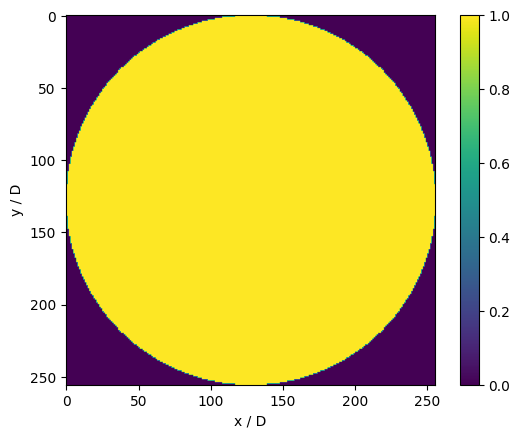

In [ ]:
grid_size = 256
pupil_grid = make_pupil_grid(grid_size)
wavelength = 650e-9

telescope_pupil_generator =  circular_aperture(1) # make_magellan_aperture(normalized=True),  make_circular_aperture(1)
telescope_pupil = telescope_pupil_generator(pupil_grid)

# imshow_field(telescope_pupil)
output = np.reshape(telescope_pupil, (grid_size, grid_size))
plt.imshow(output)
plt.colorbar()
plt.xlabel('x / D')
plt.ylabel('y / D')
plt.show()

In [ ]:
# telescope_pupil[:] = 1
# telescope_pupil.min()
# type(telescope_pupil)
# # type(zernike_modes[0])
# print(zernike_modes[0].shape)

### ZERNIKE MODES IN PUPIL PLANE

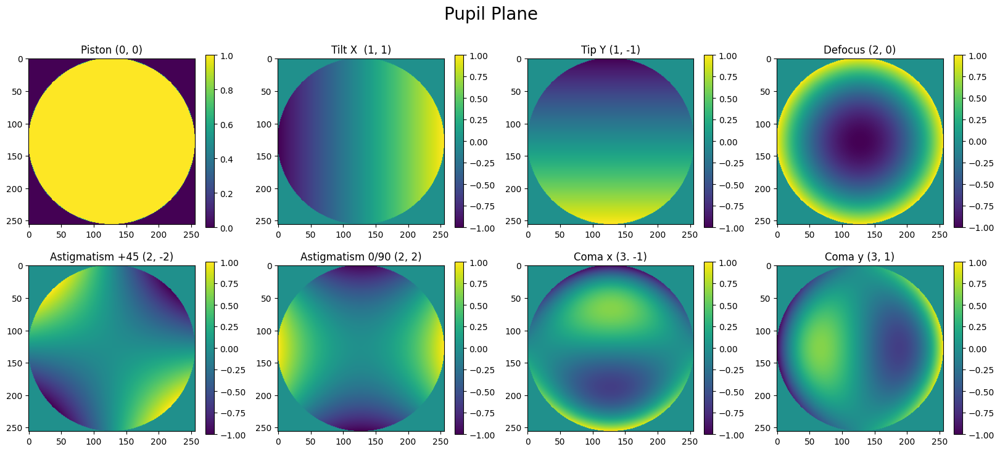

In [ ]:
grid = make_pupil_grid(256)

zernike_modes = make_zernike_basis(num_modes = 8, D=1, grid=grid)
fig=plt.figure(figsize=(20,8))
fig.suptitle('Pupil Plane', fontsize = 20)

for i, m in enumerate(zernike_modes):
  plt.subplot(2, 4, i+1)
  # imshow_field(m/m.max()) # , cmap='inferno'
  output = np.reshape(m/m.max(), (grid_size, grid_size))
  plt.imshow(output)
  plt.title(mname[i])
  plt.colorbar()

### ZERNIKE MODES IN IMAGE PLANE

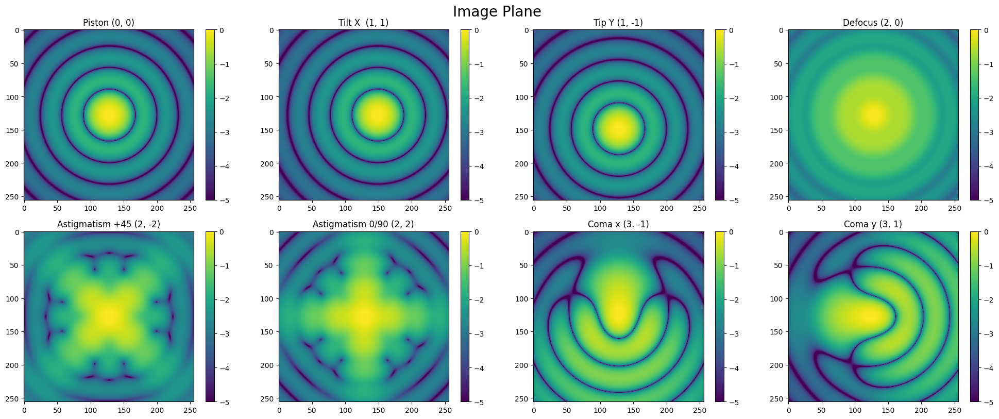

In [ ]:
zernike_modes = make_zernike_basis(num_modes = 8, D=1, grid=pupil_grid)
fig=plt.figure(figsize=(20,16))
fig.suptitle('Image Plane', fontsize = 20)

for timestep in range(len(zernike_modes)):
  # Propagation
  focal_grid = make_focal_grid(q=32, num_airy=4) # timestep*2+8 //32-timestep
  prop = FraunhoferPropagator(pupil_grid, focal_grid)

  wavefront = telescope_pupil * np.exp(zernike_modes[timestep]*1j)
  wavefront = Wavefront(wavefront)

  focal_image = prop.forward(wavefront)

  # imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)
  # plt.xlabel('Focal plane distance [$\lambda/D$]'+str(timestep%8))
  # plt.ylabel('Focal plane distance [$\lambda/D$]')
  # if timestep == 0: plt.colorbar()

  plt.subplot(4, 4, timestep+1)
  # imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)
  output = np.log10(focal_image.intensity / focal_image.intensity.max())
  output = np.reshape(output, (grid_size, grid_size))
  plt.imshow(output, vmin=-5)
  plt.title(mname[timestep%8])
  plt.colorbar()
fig.tight_layout()



In [ ]:
focal_grid = make_focal_grid(128, 1.0)
focal_grid.shape

array([256, 256])

### FRAUNHOFER PROPAGATION x2


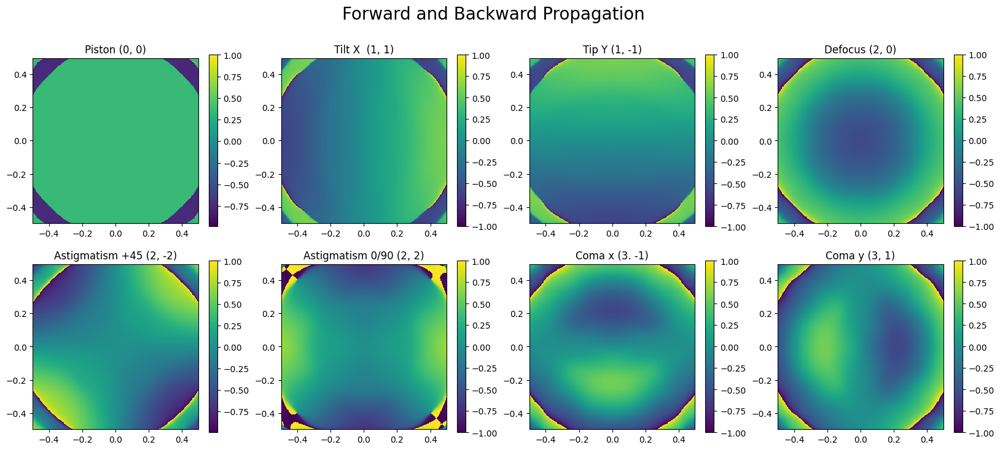

In [ ]:
zernike_modes = make_zernike_basis(num_modes = 8, D=1, grid=pupil_grid)
fig=plt.figure(figsize=(20,8))
fig.suptitle("Forward and Backward Propagation", fontsize = 20)

for timestep in range(len(zernike_modes)):
  # Propagation
  focal_grid = make_focal_grid_from_pupil_grid(grid, q=32, num_airy=4) # timestep*2+8 //32-timestep
  prop = FraunhoferPropagator(pupil_grid, focal_grid)

  wavefront = telescope_pupil * np.exp(zernike_modes[timestep]*1j)
  wavefront = Wavefront(wavefront)

  focal_image = prop.forward(wavefront)
  focal_image = prop.backward(focal_image)

  # prop_to_focal = FraunhoferPropagator(focal_grid, pupil_grid)
  # focal_image = prop_to_focal.forward(focal_image)

  # prop_to_pupil = FresnelPropagator(pupil_grid, 1)
  # focal_image = prop_to_pupil.backward(focal_image)

  # imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)
  # plt.xlabel('Focal plane distance [$\lambda/D$]'+str(timestep%8))
  # plt.ylabel('Focal plane distance [$\lambda/D$]')
  # if timestep == 0: plt.colorbar()

  plt.subplot(2, 4, timestep+1)
  imshow_field((focal_image.phase/focal_image.phase.max()))
  # imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()))
  plt.title(mname[timestep])
  plt.colorbar()


In [ ]:
wavefront.electric_field

Field([0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j])

### FRAUNHOFER + FRESHNEL PROPAGATION


AttributeError: ignored

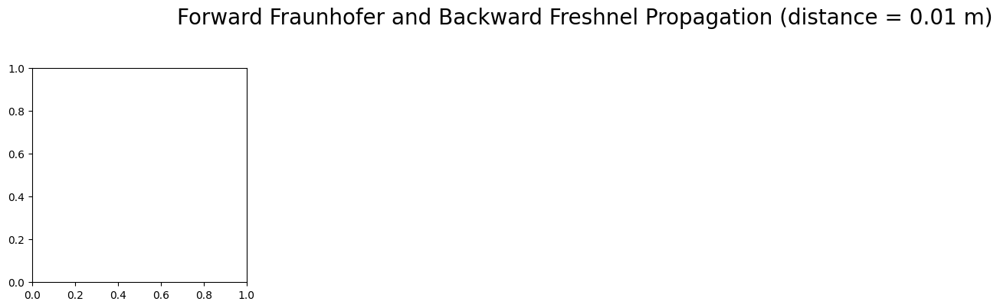

In [ ]:
#@title Hide

zernike_modes = make_zernike_basis(num_modes = 8, D=1, grid=pupil_grid)
fig=plt.figure(figsize=(20,8))
fig.suptitle("Forward Fraunhofer and Backward Freshnel Propagation", fontsize = 20)

# Setting up the propagation distances in the animation
n = 35
def easing(start, end, n):
    x = np.linspace(0, 1, n)
    y = np.where(x < 0.5, 4 * x**3, 1 - 4 * (1 - x)**3)

    return y * (end - start) + start

propagation_distances = np.concatenate([easing(0.01, 0.05, n),
                                        easing(0.05, 0.001, n),
                                        easing(0.001, 0.0005, n),
                                        easing(0.0005, 0.001, n),
                                        easing(0.001, 0.01,  2* n)])

# Starting the animation object to write to an mp4 file.
anim = FFMpegWriter('FRESHNEL.mp4', framerate=11)

for propagation_distance in propagation_distances:
  fig.suptitle("Forward Fraunhofer and Backward Freshnel Propagation (distance = {} m)".format(propagation_distance), fontsize = 20)
  for timestep in range(len(zernike_modes)):
    # Fraunhofer Propagation
    focal_grid = make_focal_grid_from_pupil_grid(pupil_grid, q=32, num_airy=4) # timestep*2+8 //32-timestep
    prop = FraunhoferPropagator(pupil_grid, focal_grid)

    wavefront = telescope_pupil * np.exp(zernike_modes[timestep]*1j)
    wavefront = Wavefront(wavefront)

    focal_image = prop.forward(wavefront)
    focal_intensity = focal_image.electric_field
    focal_intensity_image = Field(focal_intensity, focal_image.grid)

    # Freshnel Propagation
    prop_to_pupil = FresnelPropagator(pupil_grid, propagation_distance)
    # focal_image = prop_to_pupil.backward(Wavefront(focal_intensity_image))
    focal_image = prop_to_pupil.forward(wavefront)

    # Fraunhofer Propagation
    # focal_image = prop.backward(Wavefront(focal_intensity_image))
    # prop_to_focal = FraunhoferPropagator(focal_grid, pupil_grid)
    # focal_image = prop_to_focal.forward(focal_image)

    # imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)
    # plt.xlabel('Focal plane distance [$\lambda/D$]'+str(timestep%8))
    # plt.ylabel('Focal plane distance [$\lambda/D$]')
    # if timestep == 0: plt.colorbar()

    plt.subplot(2, 4, timestep+1)
    imshow_field((focal_image.phase/focal_image.phase.max()))
    # imshow_field((focal_image.intensity / focal_image.intensity.max()))
    plt.title(mname[timestep])
    plt.colorbar()
  anim.add_frame()

plt.close()
anim.close()
anim

In [ ]:
type(focal_intensity)

<ipython-input-26-10e401e5613d>:35: RuntimeWarning: invalid value encountered in log10
  output = np.log10(focal_image.phase/focal_image.phase.max())


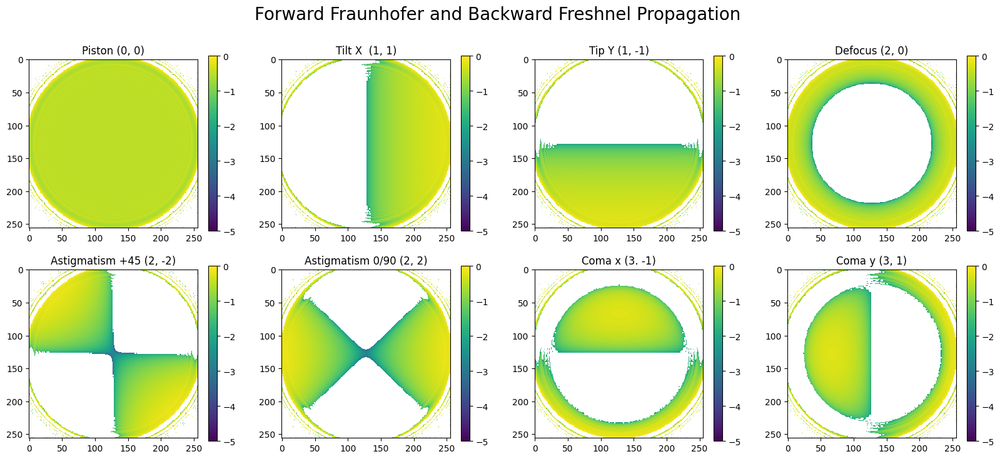

In [26]:
 zernike_modes = make_zernike_basis(num_modes = 8, D=1, grid=pupil_grid)
fig=plt.figure(figsize=(20,8))
fig.suptitle("Forward Fraunhofer and Backward Freshnel Propagation", fontsize = 20)


for timestep in range(len(zernike_modes)):
  # Fraunhofer Propagation
  focal_grid = make_focal_grid_from_pupil_grid(pupil_grid, q=32, num_airy=4) # timestep*2+8 //32-timestep
  prop = FraunhoferPropagator(pupil_grid, focal_grid)

  wavefront = telescope_pupil * np.exp(zernike_modes[timestep]*1j)
  wavefront = Wavefront(wavefront)

  focal_image = prop.forward(wavefront)
  focal_intensity = focal_image.electric_field
  focal_intensity_image = Field(focal_intensity, focal_image.grid)

  # Freshnel Propagation
  prop_to_pupil = FresnelPropagator(pupil_grid, 0.001)
  # focal_image = prop_to_pupil.forward(Wavefront(focal_intensity))
  focal_image = prop_to_pupil.forward((wavefront))

  # Fraunhofer Propagation
  # focal_image = prop.backward(Wavefront(focal_intensity_image))
  # prop_to_focal = FraunhoferPropagator(focal_grid, pupil_grid)
  # focal_image = prop_to_focal.forward(focal_image)

  # imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)
  # plt.xlabel('Focal plane distance [$\lambda/D$]'+str(timestep%8))
  # plt.ylabel('Focal plane distance [$\lambda/D$]')
  # if timestep == 0: plt.colorbar()

  plt.subplot(2, 4, timestep+1)
  # imshow_field((focal_image.phase/focal_image.phase.max()))
  output = np.log10(focal_image.phase/focal_image.phase.max())
  output = np.reshape(output, (grid_size, grid_size))
  plt.imshow(output, vmin=-5)

  # imshow_field((focal_image.intensity / focal_image.intensity.max()))
  plt.title(mname[timestep])
  plt.colorbar()



In [ ]:
#@title ZERNIKE MODES IN IMAGE PLANE ANIMATE

# num_iterations = 48 #number of iterations in our simulation
nmode = 8
fig, ax = plt.subplots(1, 2, figsize=(9, 4))

# create figure
# wavefront = Wavefront(telescope_pupil)

# generate animation object; two optional backends FFMpeg or GifWriter.
anim = FFMpegWriter('Zernike_Modes_Focal_Image.mp4', framerate=1)
#anim = GifWriter('AO_simulations_standard.gif', framerate=3)
zernike_modes = make_zernike_basis(num_modes = nmode, D=1, grid=pupil_grid)

for timestep in range(nmode):
  # Propagation
  focal_grid = make_focal_grid(q=32, num_airy=4) # timestep*2+8 //32-timestep
  prop = FraunhoferPropagator(pupil_grid, focal_grid)

  plt.subplot(1, 2, 1)
  imshow_field(zernike_modes[timestep%nmode])
  plt.colorbar()
  plt.xlabel(mname[timestep])
  plt.title("Pupil Plane")
  wavefront = telescope_pupil * np.exp(zernike_modes[timestep%nmode]*1j)
  wavefront = Wavefront(wavefront)

  focal_image = prop.forward(wavefront)

  plt.subplot(1, 2, 2)
  imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)
  plt.xlabel(mname[timestep])
  plt.ylabel('Focal plane distance [$\lambda/D$]')
  plt.colorbar()
  plt.title("Image Plane")
  fig.tight_layout()
  anim.add_frame()

plt.close()
anim.close()
anim


### ZERNIKE MODES & FOCAL PLANE MASK

In [ ]:
focal_plane_mask.shape
1048576/2

524288.0

(65536,) 65536


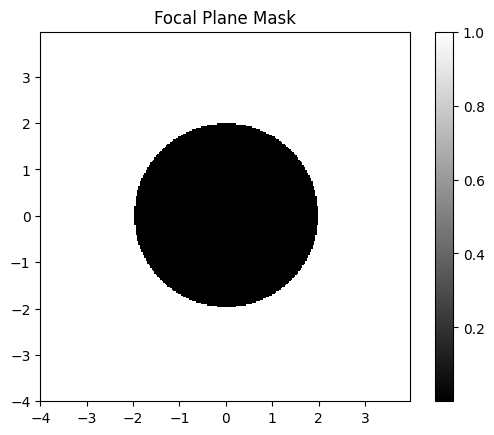

In [ ]:
# Define the parameters for the mask
mask_diameter = 1.0  # Diameter of the circular mask
central_obstruction_ratio = 0.7 # Ratio of the central obstruction diameter to the mask diameter

# Create a grid for the focal plane
# focal_grid = make_focal_grid(q=32, num_airy=4)
# focal_grid = make_focal_grid(256, 1.0)
focal_grid = make_focal_grid_from_pupil_grid(pupil_grid, q=32, num_airy=4)

# Create the circular mask
mask_radius = mask_diameter / 2
central_obstruction_radius = mask_radius * central_obstruction_ratio

# Initialize the mask with ones (no mask)
focal_plane_mask = Field(np.ones(focal_grid.size), focal_grid)
print(focal_plane_mask.shape, focal_grid.size)

# Apply the circular mask
mask = focal_grid.as_('polar').r
mask_norm = mask/mask.max()
focal_plane_mask[mask_norm > mask_radius] = 1.0  # Outside the circular mask
focal_plane_mask[mask_norm < central_obstruction_radius] = 0.00000001 # Inside the central obstruction -1000 or 0 or 0.00000001?

# Visualize the mask
imshow_field(focal_plane_mask, cmap='gray')
plt.title('Focal Plane Mask')
plt.colorbar()
plt.show()

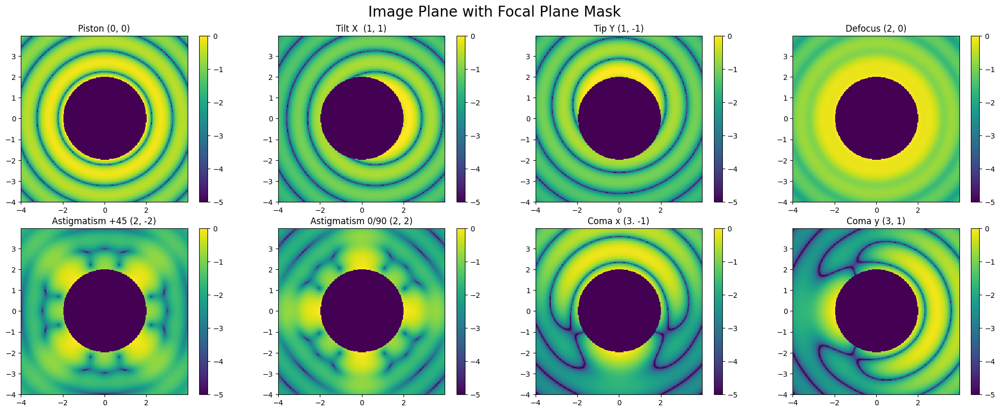

In [ ]:
zernike_modes = make_zernike_basis(num_modes=8, D=1, grid=pupil_grid)
fig = plt.figure(figsize=(20, 8))
fig.suptitle('Image Plane with Focal Plane Mask', fontsize=20)

for timestep in range(len(zernike_modes)):
    # Propagation
    focal_grid = make_focal_grid(q=32, num_airy=4) # num_airy=4
    prop = FraunhoferPropagator(pupil_grid, focal_grid)

    wavefront = telescope_pupil * np.exp(zernike_modes[timestep] * 1j)
    wavefront = Wavefront(wavefront)

    focal_image = prop.forward(wavefront)

    # Apply the focal plane mask to the intensity
    masked_intensity = focal_image.intensity * focal_plane_mask

    # Create a new Field object with the modified intensity
    # masked_focal_image = Field(masked_intensity, focal_image.grid)

    plt.subplot(2, 4, timestep + 1)
    imshow_field(np.log10(masked_intensity / masked_intensity.max()), vmin=-5)
    # imshow_field((masked_focal_image / masked_focal_image.max()) )
    plt.title(mname[timestep])
    plt.colorbar()
fig.tight_layout()
plt.show()



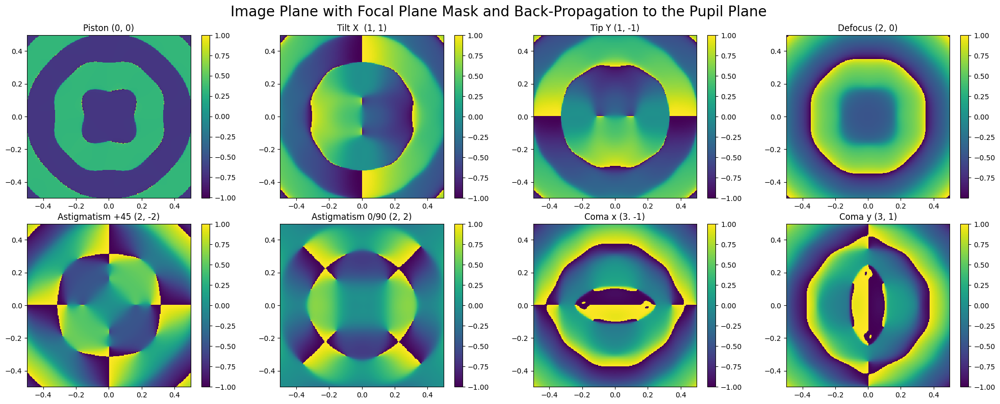

In [ ]:
zernike_modes = make_zernike_basis(num_modes=8, D=1, grid=pupil_grid)
fig = plt.figure(figsize=(20, 8))
fig.suptitle('Image Plane with Focal Plane Mask and Back-Propagation to the Pupil Plane', fontsize=20)


for timestep in range(len(zernike_modes)):
    # Propagation
    focal_grid = make_focal_grid(q=32, num_airy=4)
    prop = FraunhoferPropagator(pupil_grid, focal_grid)

    wavefront = telescope_pupil * np.exp(zernike_modes[timestep] * 1j)
    wavefront = Wavefront(wavefront)

    focal_image = prop.forward(wavefront)

    # Apply the focal plane mask to the intensity
    masked_intensity = focal_image.electric_field * focal_plane_mask
    # masked_intensity = focal_image.intensity * focal_plane_mask
    # masked_intensity = focal_image.phase * focal_plane_mask

    # Create a new Field object with the modified intensity
    # masked_focal_image = Field(masked_intensity, focal_image.grid)

    # # Propagate back to pupil plane (Fraunhofer Propagator)
    prop_to_pupil = FraunhoferPropagator(focal_grid, pupil_grid)
    wavefront_back = prop_to_pupil.forward(Wavefront(masked_intensity))

    # Propagate back to pupil plane (Fresnel Propagator)
    # prop_to_pupil = FresnelPropagator(pupil_grid, 0.0001)
    # wavefront_back = prop_to_pupil.forward(Wavefront(masked_intensity))

    # Propagate back to pupil plane
    # wavefront_back = prop.backward(Wavefront(masked_intensity))

    plt.subplot(2, 4, timestep + 1)
    imshow_field((wavefront_back.phase / wavefront_back.phase.max()))
    # imshow_field(np.log10(wavefront_back.intensity / wavefront_back.intensity.max()))
    plt.title(mname[timestep])
    plt.colorbar()
fig.tight_layout()
plt.show()

#### etc

In [ ]:
def double_plot(a, b, title='', xlabel='', ylabel='', **kwargs):
    '''A function to nicely show two fields side-to-side.
    '''
    fig, axes = plt.subplots(1, 2, gridspec_kw={'left': 0.14, 'right': 0.98, 'top': 0.95, 'bottom': 0.07, 'wspace': 0.02})
    fig.suptitle(title)

    imshow_field(a, **kwargs, ax=axes[0])
    imshow_field(b, **kwargs, ax=axes[1])

    axes[1].yaxis.set_ticks([])
    axes[0].set_xlabel(xlabel)
    axes[1].set_xlabel(xlabel)
    axes[0].set_ylabel(ylabel)

    return fig

In [ ]:
help(make_pupil_grid)

Help on function make_pupil_grid in module hcipy.field.util:

make_pupil_grid(dims, diameter=1)
    Makes a new :class:`Grid`, meant for descretisation of a pupil-plane wavefront.
    
    This grid is symmetric around the origin, and therefore has no point exactly on
    the origin for an even number of pixels.
    
    Parameters
    ----------
    dims : ndarray or integer
            The number of pixels per dimension. If this is an integer, this number
            of pixels is used for all dimensions.
    diameter : ndarray or scalar
            The diameter of the grid in each dimension. If this is a scalar, this diameter
            is used for all dimensions.
    
    Returns
    -------
    Grid
            A :class:`CartesianGrid` with :class:`RegularCoords`.



In [ ]:
focal_image.amplitude[:] = 1
print(focal_image.amplitude[0])

2.3363896729617963e-05


In [ ]:
2.43170417e-06


2.43170417e-06

In [ ]:
focal_image.total_power

Field(0.04807505)

<ipython-input-60-929a53543dd7>:10: RuntimeWarning: divide by zero encountered in log10
  imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)


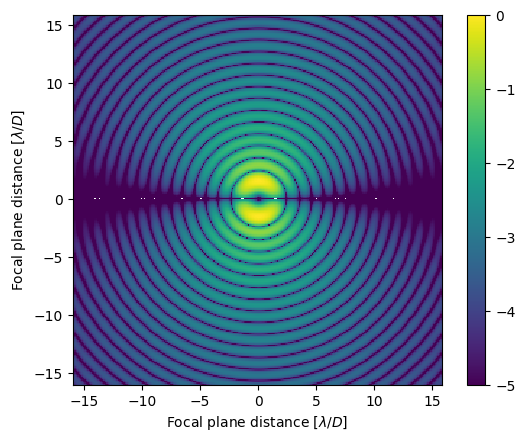

In [ ]:
zernike_modes = make_zernike_basis(num_modes = 8, D=1, grid=pupil_grid)
wavefront = zernike_modes[6]*telescope_pupil
wavefront = Wavefront(wavefront)

focal_grid = make_focal_grid(q=8, num_airy=16)
prop = FraunhoferPropagator(pupil_grid, focal_grid)

focal_image = prop.forward(wavefront)

imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)
plt.xlabel('Focal plane distance [$\lambda/D$]')
plt.ylabel('Focal plane distance [$\lambda/D$]')
plt.colorbar()
plt.show()

In [ ]:
psf = focal_image.intensity
psf_shape = psf.grid.shape

slicefoc = psf.shaped[:, psf_shape[0] // 2]
slicefoc_normalised = slicefoc / psf.max()


In [ ]:
np.linspace(1 - 0.2 / 2., 1 + 0.2 / 2., 11)

array([0.9 , 0.92, 0.94, 0.96, 0.98, 1.  , 1.02, 1.04, 1.06, 1.08, 1.1 ])

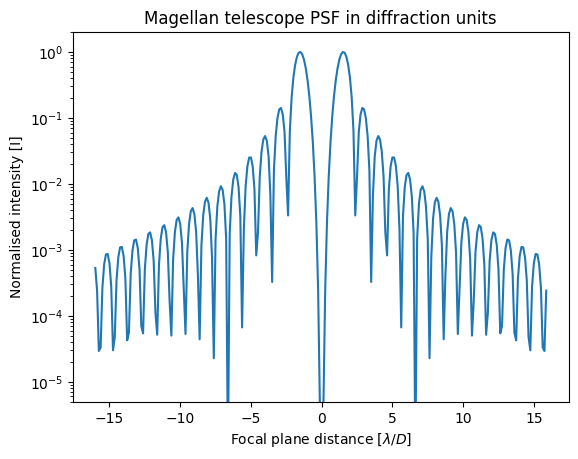

In [ ]:
plt.plot(focal_grid.x.reshape(psf_shape)[0, :], slicefoc_normalised)
plt.xlabel('Focal plane distance [$\lambda/D$]')
plt.ylabel('Normalised intensity [I]')
plt.yscale('log')
plt.title('Magellan telescope PSF in diffraction units')
# plt.xlim(-10, 10)
plt.ylim(5e-6, 2)
plt.show()

<ipython-input-64-1bedc2cf802d>:8: RuntimeWarning: divide by zero encountered in log10
  imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)


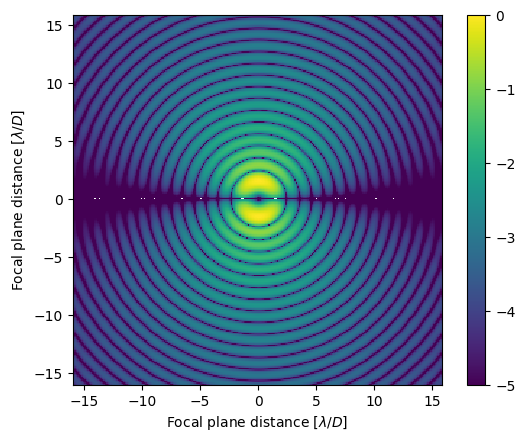

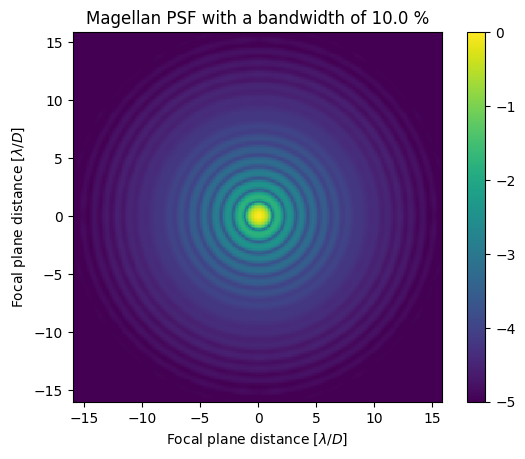

In [ ]:
bandwidth = 0.1

focal_total = 0
for wlen in np.linspace(1 - bandwidth / 2., 1 + bandwidth / 2., 11):
    wavefront = Wavefront(telescope_pupil, wlen)
    focal_total += prop(wavefront).intensity

imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)
plt.xlabel('Focal plane distance [$\lambda/D$]')
plt.ylabel('Focal plane distance [$\lambda/D$]')
plt.colorbar()
plt.show()

imshow_field(np.log10(focal_total / focal_total.max()), vmin=-5)
plt.title('Magellan PSF with a bandwidth of {:.1f} %'.format(bandwidth * 100))
plt.colorbar()
plt.xlabel('Focal plane distance [$\lambda/D$]')
plt.ylabel('Focal plane distance [$\lambda/D$]')
plt.show()

In [ ]:
focal_total.shape
focal_total.argmax()


32896

In [ ]:
focal_total.shape[0]/3


21845.333333333332

In [ ]:
focal_total[0: int(focal_total.shape[0]/3)] = 0.001
focal_total[int(focal_total.shape[0]*2/3):] = 0.001

<ipython-input-68-bd816f4216f9>:1: RuntimeWarning: divide by zero encountered in log10
  imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)


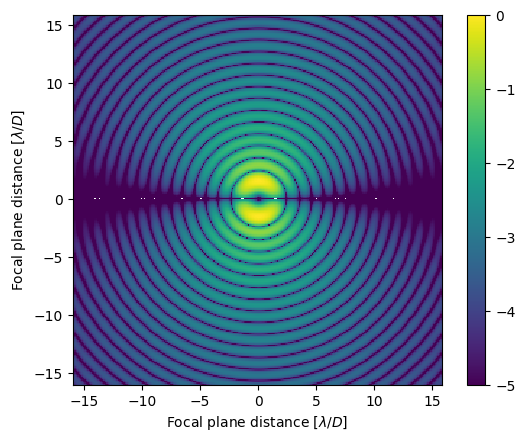

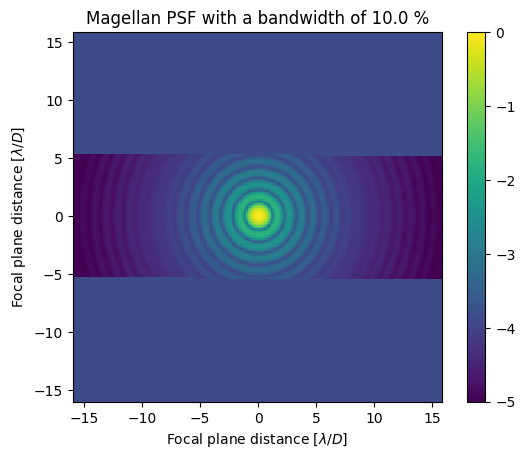

In [ ]:
imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)
plt.xlabel('Focal plane distance [$\lambda/D$]')
plt.ylabel('Focal plane distance [$\lambda/D$]')
plt.colorbar()
plt.show()

imshow_field(np.log10(focal_total / focal_total.max()), vmin=-5)
plt.title('Magellan PSF with a bandwidth of {:.1f} %'.format(bandwidth * 100))
plt.colorbar()
plt.xlabel('Focal plane distance [$\lambda/D$]')
plt.ylabel('Focal plane distance [$\lambda/D$]')
plt.show()

In [ ]:
psf = focal_total
psf_shape = psf.grid.shape

slicefoc = psf.shaped[:, psf_shape[0] // 2]
slicefoc_normalised_bw = slicefoc / psf.max()

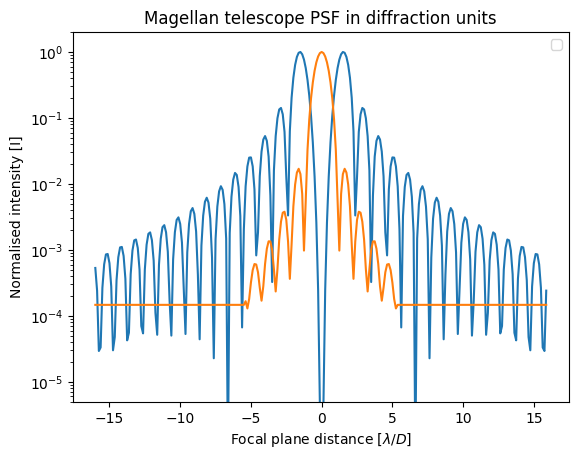

In [ ]:
plt.plot(focal_grid.x.reshape(psf_shape)[0, :], slicefoc_normalised)
plt.plot(focal_grid.x.reshape(psf_shape)[0, :], slicefoc_normalised_bw)
plt.legend()
plt.xlabel('Focal plane distance [$\lambda/D$]')
plt.ylabel('Normalised intensity [I]')
plt.yscale('log')
plt.title('Magellan telescope PSF in diffraction units')
# plt.xlim(-10, 10)
plt.ylim(5e-6, 2)
plt.show()

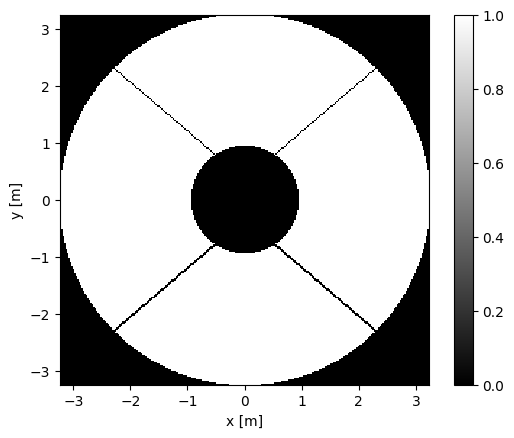

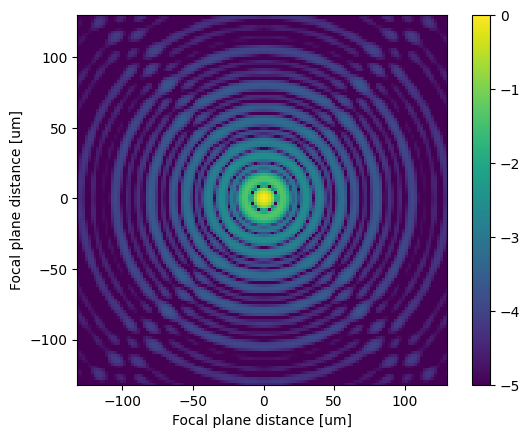

In [ ]:
pupil_diameter = 6.5 # m
effective_focal_length = 71.5 # m
wavelength = 750e-9 # m

pupil_grid = make_pupil_grid(256, diameter=pupil_diameter)

telescope_pupil_generator = make_magellan_aperture()
telescope_pupil = telescope_pupil_generator(pupil_grid)

imshow_field(telescope_pupil, cmap='gray')
plt.colorbar()
plt.xlabel('x [m]')
plt.ylabel('y [m]')
plt.show()

wavefront = Wavefront(telescope_pupil, wavelength)

focal_grid = make_focal_grid(q=4, num_airy=16, pupil_diameter=pupil_diameter, focal_length=effective_focal_length, reference_wavelength=wavelength)
prop = FraunhoferPropagator(pupil_grid, focal_grid, focal_length=effective_focal_length)

focal_image = prop.forward(wavefront)

imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5, grid_units=1e-6)
plt.xlabel('Focal plane distance [um]')
plt.ylabel('Focal plane distance [um]')
plt.colorbar()
plt.show()

In [ ]:
pupil_grid

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# from matplotlib.animation import FuncAnimation

# # Create a figure and axes
# fig, ax = plt.subplots()
# ax.set_xlim(-1.5, 1.5)
# ax.set_ylim(-1.5, 1.5)

# # Initialize the plot with a point at the starting position
# point, = ax.plot([], [], 'ro', markersize=8)

# # Function to compute the parametric equations (x(t), y(t))
# def parametric_equations(t):
#     x = np.sin(2 * np.pi * t)
#     y = np.cos(2 * np.pi * t)
#     return x, y

# # Initialization function
# def init():
#     point.set_data([], [])
#     return point,

# # Update function to move the point along the parametric curve
# def update(frame):
#     t = frame / 100.0  # Adjust the speed of animation by changing the denominator
#     x, y = parametric_equations(t)
#     point.set_data(x, y)
#     return point,

# # Create the animation
# ani = FuncAnimation(fig, update, frames=100, init_func=init, blit=True)

# # Display the animation in the Colab notebook
# from IPython.display import HTML
# # HTML(ani.to_jshtml())


In [ ]:
lst = ['a','b','c','d']

In [ ]:
for i,m in enumerate(lst):
  print(i,m)

0 a
1 b
2 c
3 d


In [ ]:
type(grid)

hcipy.field.cartesian_grid.CartesianGrid

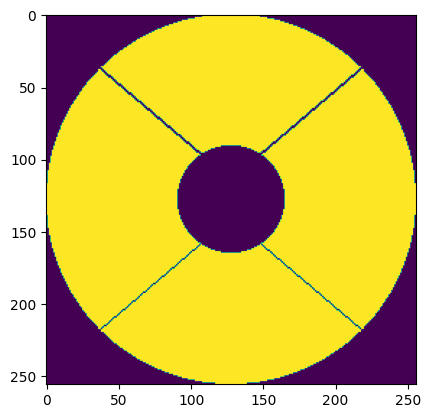

In [ ]:
wavefront = Wavefront(telescope_pupil)
wavefront.amplitude.min()
plt.imshow(np.array(wavefront.amplitude).reshape(256,256))
# imshow_field(wavefront)

In [ ]:
# num_iterations = 48 #number of iterations in our simulation

# # create figure
# # wavefront = Wavefront(telescope_pupil)

# # generate animation object; two optional backends FFMpeg or GifWriter.
# anim = FFMpegWriter('AO_simulations_standard.mp4', framerate=2)
# #anim = GifWriter('AO_simulations_standard.gif', framerate=3)
# zernike_modes = make_zernike_basis(num_modes = 8, D=1, grid=pupil_grid)


# for timestep in range(num_iterations):
#   # Propagation
#   focal_grid = make_focal_grid(q=8, num_airy=16) # timestep*2+8 //32-timestep
#   prop = FraunhoferPropagator(pupil_grid, focal_grid)

#   wavefront = telescope_pupil * zernike_modes[timestep%8]

#   imshow_field(wavefront, vmin=-5)
#   plt.xlabel('Zernike Mode: '+str(timestep%8))
#   if timestep == 0: plt.colorbar()
#   anim.add_frame()

# plt.close()
# anim.close()
# anim

In [ ]:
a = telescope_pupil * zernike_modes[2]
a[0:15]

Field([-0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0.,
       -0., -0.])

In [ ]:
masked_focal_image.max()

Field(0.07615781)

In [ ]:
# pupil_grid = make_pupil_grid(512)
focal_grid = make_focal_grid(q=32, num_airy=4)
print( focal_grid.size)

65536


In [ ]:
type(masked_focal_image)

hcipy.field.field.Field

## HCIPY#2 LYOT PLANE


In [ ]:
#@title Libary Import
from hcipy import *
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

# For notebook animations
from matplotlib import animation
from IPython.display import HTML

### TELESCOPE APERTURE

In [ ]:
mpl.rcParams['figure.dpi'] = 100

pupil_grid = make_pupil_grid(256, 1.5)
focal_grid = make_focal_grid(8, 12)
prop = FraunhoferPropagator(pupil_grid, focal_grid)

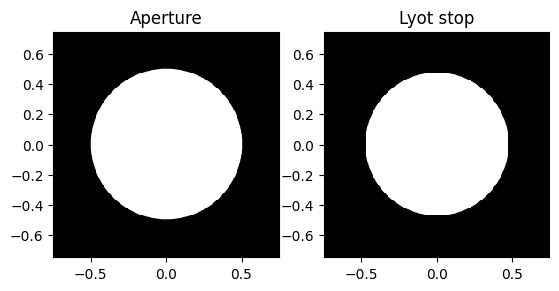

In [ ]:
aperture = evaluate_supersampled(make_circular_aperture(1), pupil_grid, 4)
lyot_mask = evaluate_supersampled(make_circular_aperture(0.95), pupil_grid, 4)

plt.subplot(1,2,1)
plt.title('Aperture')
imshow_field(aperture, cmap='gray')
plt.subplot(1,2,2)

plt.title('Lyot stop')
imshow_field(lyot_mask, cmap='gray')
plt.show()

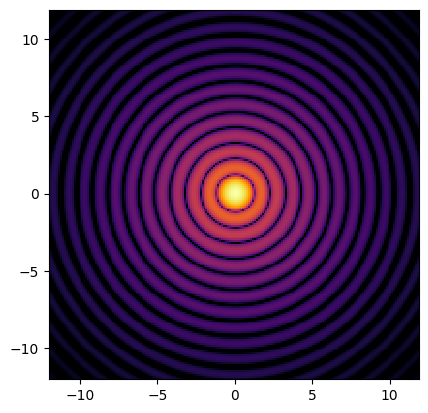

In [ ]:
make_circular_aperturewf = Wavefront(aperture)
img_ref = prop(wf).intensity

imshow_field(np.log10(img_ref / img_ref.max()), vmin=-5, cmap='inferno')
plt.show()

### LYOT PLANE

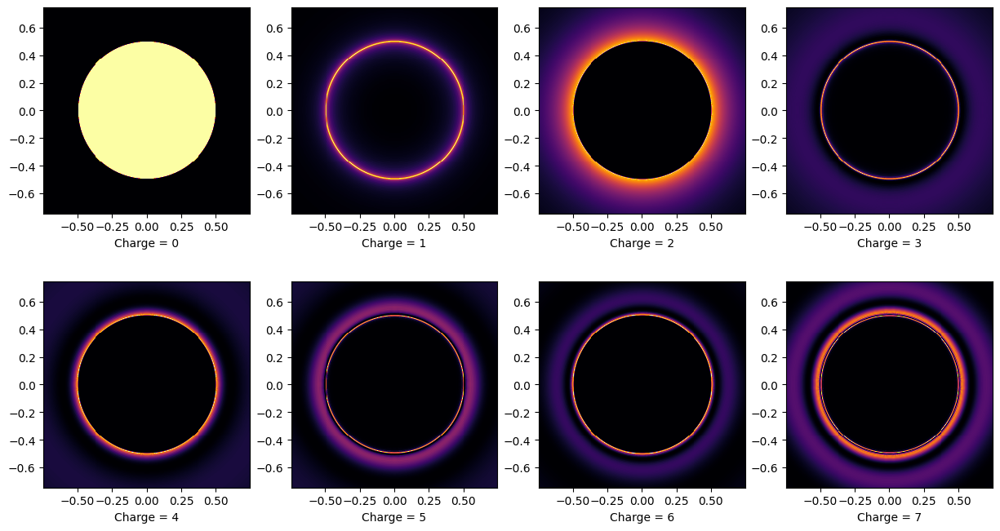

In [ ]:
fig = plt.figure(figsize = (15,8))

for i in range(8):
  charge = i
  coro = VortexCoronagraph(pupil_grid, charge)
  lyot_stop = Apodizer(lyot_mask)

  wf = Wavefront(aperture)
  lyot_plane = coro(wf)

  plt.subplot(2, 4, i+1)
  imshow_field(lyot_plane.intensity, cmap='inferno')
  plt.xlabel("Charge = {}".format(i))
  plt.colorbar

In [ ]:
charge = 2
coro = VortexCoronagraph(pupil_grid, charge)
lyot_stop = Apodizer(lyot_mask)

<function matplotlib.pyplot.colorbar(mappable=None, cax=None, ax=None, **kwargs)>

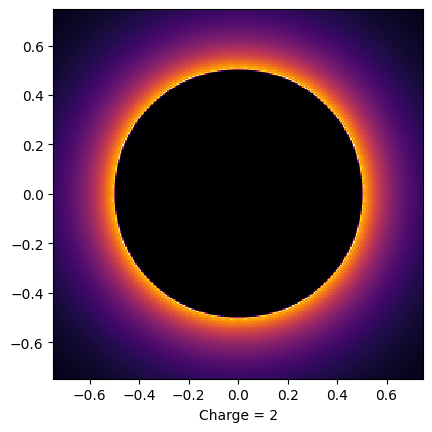

In [ ]:
wf = Wavefront(aperture)
lyot_plane = coro(wf)

imshow_field(lyot_plane.intensity, cmap='inferno')
plt.xlabel("Charge = {}".format(charge))
plt.colorbar

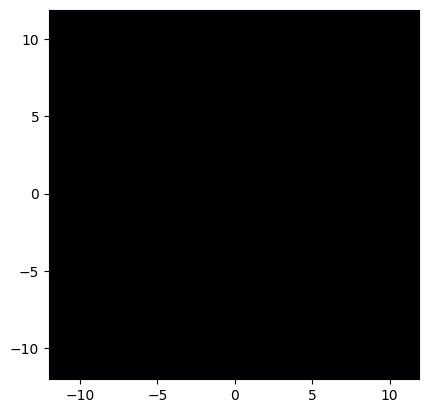

In [ ]:
post_lyot_mask = lyot_stop(lyot_plane)
img = prop(post_lyot_mask).intensity

imshow_field(np.log10(img / img_ref.max()), vmin=-5, vmax=0, cmap='inferno')
plt.show()

In [ ]:
Configuration

hcipy.config.config.Configuration

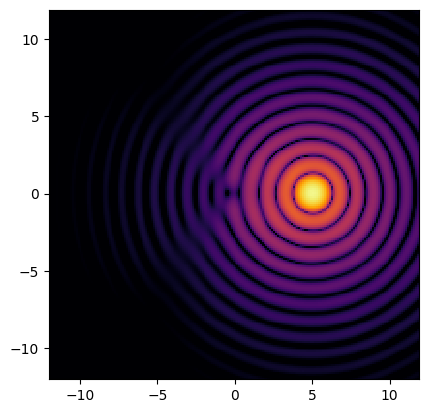

In [ ]:
wf = Wavefront(aperture * np.exp(2j * np.pi * pupil_grid.x * 5))
img = prop(lyot_stop(coro(wf))).intensity

imshow_field(np.log10(img / img_ref.max()), vmin=-5, vmax=0, cmap='inferno')
plt.show()

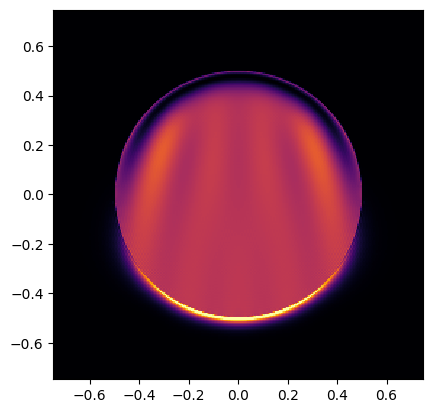

In [ ]:
lyot = coro(wf)

imshow_field(lyot.intensity, vmax=2, cmap='inferno')
plt.show()

In [ ]:
def create_offaxis_animation(coro):
    fig = plt.figure()
    plt.subplot(1,2,1)
    plt.title('Lyot plane')
    im1 = imshow_field(lyot_plane.intensity, vmax=1, cmap='inferno')
    plt.subplot(1,2,2)
    plt.title('Science image plane')
    im2 = imshow_field(np.log10(img / img_ref.max()), vmin=-5, vmax=0, cmap='inferno')
    plt.close(fig)

    def animate(angular_separation):
        wf = Wavefront(aperture * np.exp(2j * np.pi * pupil_grid.x * angular_separation))
        lyot = coro(wf)
        img = prop(lyot_stop(lyot))

        im1.set_data(*pupil_grid.separated_coords, lyot.intensity.shaped)
        im2.set_data(*focal_grid.separated_coords, np.log10(img.intensity.shaped / img_ref.max()))

        return [im1, im2]

    angular_separations = np.linspace(-5, 5, 51)
    anim = animation.FuncAnimation(fig, animate, angular_separations, interval=160, blit=True)
    return HTML(anim.to_html5_video())

create_offaxis_animation(coro)

### LYOT STOP AND ZERNIKE MODE

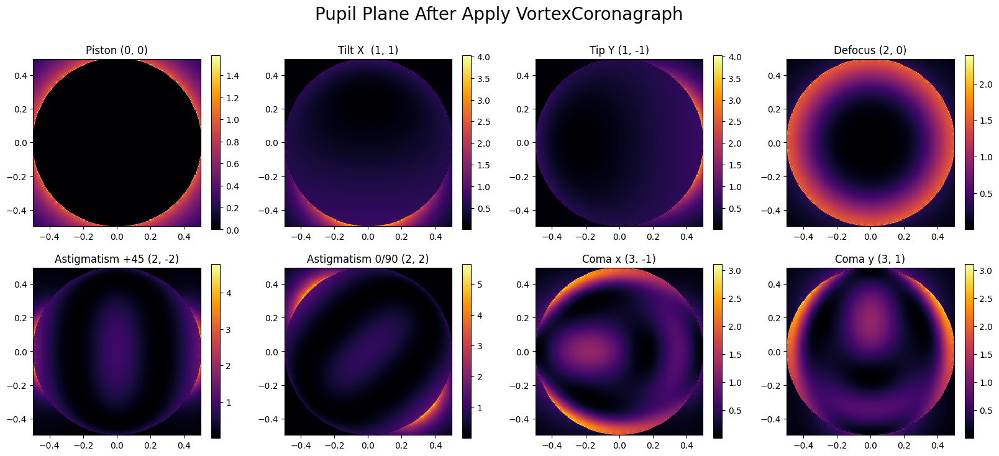

In [ ]:
zernike_modes = make_zernike_basis(num_modes = 8, D=1, grid=pupil_grid)
fig=plt.figure(figsize=(20,8))
fig.suptitle('Pupil Plane After Apply VortexCoronagraph', fontsize = 20)

lyot_mask = evaluate_supersampled(make_circular_aperture(1), pupil_grid, 4)
charge = 2
coro = VortexCoronagraph(pupil_grid, charge)
lyot_stop = Apodizer(lyot_mask)

for timestep in range(len(zernike_modes)):
  # Propagation
  focal_grid = make_focal_grid(q=16, num_airy=4) # timestep*2+8 //32-timestep
  prop = FraunhoferPropagator(pupil_grid, focal_grid)

  wavefront = telescope_pupil * np.exp(zernike_modes[timestep]*1j)
  wavefront = Wavefront(wavefront)
  lyot_plane = coro(wavefront)

  post_lyot_mask = lyot_stop(lyot_plane)
  img = prop(post_lyot_mask).intensity

  # focal_image = prop.forward(wavefront)

  # imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)
  # plt.xlabel('Focal plane distance [$\lambda/D$]'+str(timestep%8))
  # plt.ylabel('Focal plane distance [$\lambda/D$]')
  # if timestep == 0: plt.colorbar()

  plt.subplot(2, 4, timestep+1)
  # imshow_field(np.log10(lyot_plane.intensity / lyot_plane.intensity.max()), vmin=-5, vmax = 0, cmap='inferno')
  # imshow_field(np.log10(img), cmap='inferno') # , vmin=-5, vmax = 0
  imshow_field(lyot_plane.intensity, cmap='inferno')
  plt.title(mname[timestep])
  plt.colorbar()


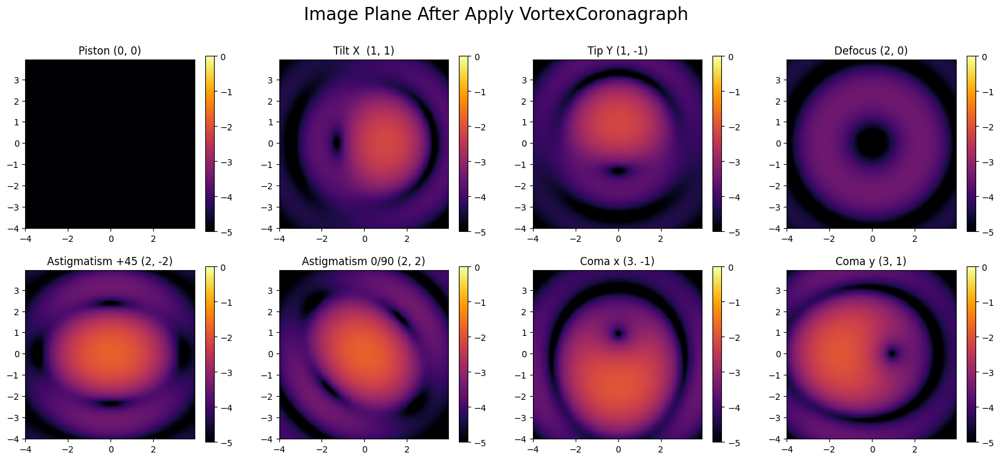

In [ ]:
zernike_modes = make_zernike_basis(num_modes = 8, D=1, grid=pupil_grid)
fig=plt.figure(figsize=(20,8))
fig.suptitle('Image Plane After Apply VortexCoronagraph', fontsize = 20)

lyot_mask = evaluate_supersampled(make_circular_aperture(0.5), pupil_grid, 4)
charge = 2
coro = VortexCoronagraph(pupil_grid, charge)
lyot_stop = Apodizer(lyot_mask)

for timestep in range(len(zernike_modes)):
  # Propagation
  focal_grid = make_focal_grid(q=16, num_airy=4) # timestep*2+8 //32-timestep
  prop = FraunhoferPropagator(pupil_grid, focal_grid)

  wavefront = telescope_pupil * np.exp(zernike_modes[timestep]*1j)
  wavefront = Wavefront(wavefront)
  lyot_plane = coro(wavefront)

  post_lyot_mask = lyot_stop(lyot_plane)
  img = prop(post_lyot_mask).intensity

  # focal_image = prop.forward(wavefront)

  # imshow_field(np.log10(focal_image.intensity / focal_image.intensity.max()), vmin=-5)
  # plt.xlabel('Focal plane distance [$\lambda/D$]'+str(timestep%8))
  # plt.ylabel('Focal plane distance [$\lambda/D$]')
  # if timestep == 0: plt.colorbar()

  plt.subplot(2, 4, timestep+1)
  # imshow_field(np.log10(lyot_plane.intensity / lyot_plane.intensity.max()), vmin=-5, vmax = 0, cmap='inferno')
  imshow_field(np.log10(img), vmin=-5, vmax = 0, cmap='inferno') # , vmin=-5, vmax = 0
  # imshow_field(lyot_plane.intensity, cmap='inferno')
  plt.title(mname[timestep])
  plt.colorbar()

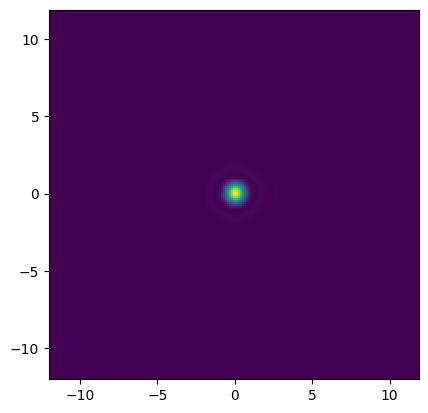

In [ ]:
# Define the parameters of your optical system
wavelength = 1e-6  # Wavelength of light (in meters)
focal_length = 1.0  # Focal length of the telescope (in meters)
aperture_diameter = 0.1  # Diameter of the telescope aperture (in meters)

# Create a focal plane grid
grid_size = 512
focal_plane_grid = make_focal_grid(grid_size, wavelength, focal_length, aperture_diameter)

# Design your focal plane mask (e.g., coronagraph)
coronagraph = make_circular_aperture(0.1)(focal_plane_grid)

# Apply the mask to your optical system
telescope = OpticalSystem([coronagraph])
telescope.pupil_grid = make_pupil_grid(256, 1.5)
telescope.focal_grid = focal_plane_grid

# Simulate the propagation of light through the system
wf = Wavefront(make_circular_aperture(1.0)(pupil_grid))
propagated_wf = prop.forward(wf)

# Analyze the results or save the mask
imshow_field(propagated_wf.intensity)

# You can save the mask as a FITS file if needed
# write_fits('coronagraph_mask.fits', propagated_wf.imag)



## HCIPY#3 NEAR FIELD: FRESHNEL PROPAGATION

In [ ]:
#@title Libary Import
from hcipy import *

import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

def double_plot(a, b, title='', xlabel='', ylabel='', **kwargs):
    '''A function to nicely show two fields side-to-side.
    '''
    fig, axes = plt.subplots(1, 2, gridspec_kw={'left': 0.14, 'right': 0.98, 'top': 0.95, 'bottom': 0.07, 'wspace': 0.02})
    fig.suptitle(title)

    imshow_field(a, **kwargs, ax=axes[0])
    imshow_field(b, **kwargs, ax=axes[1])

    axes[1].yaxis.set_ticks([])
    axes[0].set_xlabel(xlabel)
    axes[1].set_xlabel(xlabel)
    axes[0].set_ylabel(ylabel)

    return fig

### TELESCOPE APERTURE

In [ ]:
pupil_diameter = 3e-3 # meter
wavelength = 500e-9 # meter

pupil_grid = make_pupil_grid(256, 1.2 * pupil_diameter)
aperture_circ = evaluate_supersampled(circular_aperture(pupil_diameter), pupil_grid, 8)

aperture_luvoir = evaluate_supersampled(make_luvoir_a_aperture(True), pupil_grid.scaled(1 / pupil_diameter), 8)
aperture_luvoir.grid = pupil_grid

wf_circ = Wavefront(aperture_circ, wavelength)
wf_luvoir = Wavefront(aperture_luvoir, wavelength)

<ipython-input-91-f1fc236fc4f7>:5: DeprecationWarning: circular_aperture is deprecated. Its new name is make_circular_aperture.
  aperture_circ = evaluate_supersampled(circular_aperture(pupil_diameter), pupil_grid, 8)


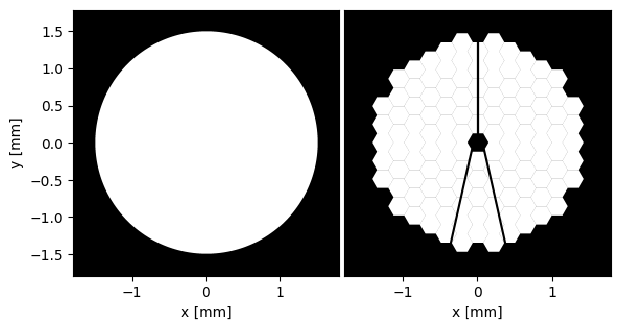

In [ ]:
double_plot(aperture_circ, aperture_luvoir,
            xlabel='x [mm]', ylabel='y [mm]',
            grid_units=1e-3, cmap='gray')
plt.show()

### FRESHNEL PROPAGATOR

In [ ]:
propagation_distance = 0.1 # meter

fresnel = FresnelPropagator(pupil_grid, propagation_distance)

### FRESHNEL PROPAGATION ANIM

In [ ]:
def easing(start, end, n):
    x = np.linspace(0, 1, n)
    y = np.where(x < 0.5, 4 * x**3, 1 - 4 * (1 - x)**3)

    return y * (end - start) + start

# Setting up the propagation distances in the animation
n = 35
propagation_distances = np.concatenate([easing(0, 0.1, n),
                                        easing(0.1, 1, n),
                                        easing(1, 5, n),
                                        easing(5, 20, n),
                                        easing(20, 0, 2 * n)])

# Starting the animation object to write to an mp4 file.
anim = FFMpegWriter('near_field.mp4', framerate=11)

for propagation_distance in propagation_distances:
    # Set the propagation distance
    fresnel.distance = propagation_distance

    # Propagate both wavefronts
    img_circ = fresnel(wf_circ)
    img_luvoir = fresnel(wf_luvoir)

    # Plotting the current frame of the animation.
    double_plot(img_circ.intensity, img_luvoir.intensity,
                title='Distance: %.3f meter' % propagation_distance,
                xlabel='x [mm]', ylabel='y [mm]',
                vmax=2, cmap='inferno', grid_units=1e-3)

    # Adding the frame to the mp4 file and closing the created figure.
    anim.add_frame()
    plt.close()

anim.close()
anim

## TEST

In [ ]:
prop = FraunhoferPropagator(pupil_grid, focal_grid)

In [ ]:
prop.forward

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from hcipy import *

N = 512

#Defining the grids.
pupil_grid = make_pupil_grid(N)
focal_grid = make_focal_grid_from_pupil_grid(pupil_grid, q=8, num_airy=5)
# focal_grid = make_focal_grid(pupil_grid, 8, 5)

#The propagator.
prop = FraunhoferPropagator(pupil_grid, focal_grid)

#Aperture function
aperture = make_circular_aperture(1)(pupil_grid)

#The wavefront in the pupil.
pupil_wavefront = Wavefront(aperture)

#Now we propagate it to the focal plane.
focal_wavefront = prop(pupil_wavefront)

#Setting the amount of photons per unit time.
focal_wavefront.total_power = 1000

#---------------------------------------------------------------------------------
#First example with scalars for the noise sources.
#---------------------------------------------------------------------------------

flatfield = 0.05 # = 5% flat field error
darkcurrentrate = 2 # = dark current counts per second
readnoise = 100 # = rms counts per read out
photonnoise = True

#Creating our detector.
detector_example_1 = NoisyDetector(input_grid=focal_grid, include_photon_noise=photonnoise, flat_field=flatfield, dark_current_rate=darkcurrentrate, read_noise=readnoise)

integration_time = np.logspace(1,6,6)

for t in integration_time:

    #Science measurement.
    detector_example_1.integrate(focal_wavefront, t)
    measurement = detector_example_1.read_out()

    plt.figure()
    imshow_field(measurement)
    plt.colorbar()
    plt.title('Example 1, t = ' + str(t) + ' seconds')

plt.show()

#---------------------------------------------------------------------------------
#Second example with arrays for the noise sources.
#---------------------------------------------------------------------------------

flatfield = 1 + Field(np.random.rand(focal_wavefront.power.size) * 0.05, focal_grid)
darkcurrentrate = Field(np.random.rand(focal_wavefront.power.size) * 2, focal_grid)
readnoise = Field(np.random.rand(focal_wavefront.power.size) * 100, focal_grid)
photonnoise = True

plt.figure()
imshow_field(flatfield)
plt.colorbar()
plt.title('Flat field map')

plt.figure()
imshow_field(darkcurrentrate)
plt.colorbar()
plt.title('Dark current map')

plt.figure()
imshow_field(readnoise)
plt.colorbar()
plt.title('RMS read-noise map')

#Creating our detector.
detector_example_2 = NoisyDetector(input_grid=focal_grid, include_photon_noise=photonnoise, flat_field=flatfield, dark_current_rate=darkcurrentrate, read_noise=readnoise)

integration_time = np.logspace(1,6,6)

for t in integration_time:

    #Science measurement.
    detector_example_2.integrate(focal_wavefront, t)
    measurement = detector_example_2.read_out()

    plt.figure()
    imshow_field(measurement)
    plt.colorbar()
    plt.title('Example 2, t = ' + str(t) + ' seconds')

plt.show()

TypeError: ignored

In [ ]:
0.1+0.2

0.30000000000000004

In [ ]:
bin(15)

'0b1111'

In [ ]:

# Function to convert decimal number
# to binary using recursion
def DecimalToBinary(num):

    if num >= 1:
        DecimalToBinary(num // 2)
    print(num % 2, end = '')

# Driver Code
if __name__ == '__main__':

    # decimal value
    dec_val = 1

    # Calling function
    print(binary(dec_val))

00111111100000000000000000000000


In [ ]:
(24//2)%2

0

In [ ]:
import struct
def binary(num):
    return ''.join('{:0>8b}'.format(c) for c in struct.pack('!f', num))